In [57]:
%load_ext autoreload
%autoreload 2
from eden.util import configure_logging
import logging
logger = logging.getLogger()
configure_logging(logger,verbosity=2)
from IPython.core.display import HTML
HTML('<style>.container { width:95% !important; }</style>')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [58]:
%matplotlib inline
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import mpld3
from mpld3 import plugins, utils
#mpld3.enable_notebook()

# Utilities

In [59]:
def evaluate_predictability(test_graphs, fit_wrapped_predictor):
    import GArDen.interfaces as garden
    
    predictions = garden.predict(test_graphs, program=fit_wrapped_predictor)
    y_pred = []
    y_score = []
    y_test = []
    for prediction in predictions:
        y_pred.append(prediction.graph['prediction'])
        y_score.append(prediction.graph['score'])
        y_test.append(prediction.graph['target'])

    from sklearn import metrics
    import numpy as np
    # confusion matrix
    cm = metrics.confusion_matrix(y_test, y_pred)
    np.set_printoptions(precision=2)
    print 'Confusion matrix:'
    print(cm)

    #classification
    print(metrics.classification_report(y_test, y_pred))

    #roc
    print 'ROC: %.3f'%(metrics.roc_auc_score(y_test, y_score))

In [60]:
#code for making artificial dataset
import random
def random_string(length,alphabet_list):
    rand_str = ''.join(random.choice(alphabet_list) for i in range(length))
    return rand_str

def perturb(seed,alphabet_list,p=0.5):
    seq=''
    for c in seed:
        if random.random() < p: c = random.choice(alphabet_list)
        seq += c
    return seq

def make_artificial_dataset(alphabet='ACGU', motives=None, motif_length=6, 
                            sequence_length=100, n_sequences=1000, n_motives=2, p=0.2,
                           random_state=1):
    random.seed(random_state)
    alphabet_list=[c for c in alphabet]
    
    if motives is None:
        motives=[]
        for i in range(n_motives):
            motives.append(random_string(motif_length,alphabet_list))
    else:
        motif_length = len(motives[0])
        n_motives = len(motives)
    
    sequence_length = sequence_length / len(motives)
    flanking_length = (sequence_length - motif_length ) / 2
    n_seq_per_motif = n_sequences

    counter=0
    seqs=[]
    for i in range(n_seq_per_motif):
        total_seq = ''
        for j in range(n_motives):
            left_flanking = random_string(flanking_length,alphabet_list)
            right_flanking = random_string(flanking_length,alphabet_list)
            noisy_motif = perturb(motives[j],alphabet_list,p)
            seq = left_flanking + noisy_motif + right_flanking
            total_seq += seq
        seqs.append(('>ID%d'%counter,total_seq))
        counter += 1
    return motives, seqs

# Experimental Setup

In [257]:
#setup parameters
alphabet='ACGU'
semi_len=7
motives=['A'*semi_len+'C'*semi_len+'G'*semi_len,
         'U'*semi_len+'G'*semi_len +'A'*semi_len,
         'C'*semi_len+'A'*semi_len +'U'*semi_len]
sequence_length=150
n_sequences=200
p=0.2

#make dataset
motives, seqs = make_artificial_dataset(alphabet=alphabet,
                                        motives=motives,
                                        sequence_length=sequence_length,
                                        n_sequences=n_sequences,
                                        p=p,
                                        random_state=8)

In [258]:
#display
print 'Motives and sample of their perturbed variants:'
alphabet_list=[c for c in alphabet]
for motif in motives: 
    print
    print 'true motif:', motif, ' noisy: ',
    for i in range(4):
        print perturb(motif,alphabet_list,p=p),

Motives and sample of their perturbed variants:

true motif: AAAAAAACCCCCCCGGGGGGG  noisy:  AAACAAACCCCCACGGGGGGG ACAAAAACCCCCCCGGGGGGG GAAAAAGCCCCCUCGGACGGG AAAUAAUCCCCACCGGGGGGG
true motif: UUUUUUUGGGGGGGAAAAAAA  noisy:  UUUUUUUGGGGGUGAAAAAAA UUUUUUAGGAGGGCAGAAAAA UUUUUUUGGGGCGGUAAAGAA UUUUUUCGGGGGGGAAACAAA
true motif: CCCCCCCAAAAAAAUUUUUUU  noisy:  CACCCCCAAAAUAAGUUUUUU UCGCAUCAAAAAAAUUUUUUU CCCCCCCAAAUGAAUUUGUGU CCCACCCUAAAAAAUUUUUUU


In [259]:
for h, seq in seqs[:3]:
    print seq

AUAGAAUAGCCCAUAAAAAAACCUCCCCGGUGGGGAAACCUCACUAGCGGAAGGAUGGAAACCUCUUUUUGAGGGGGAACAAAACCUUACAGUAUCAUAUAUAUUUGAUCAGCGCCCCUAAAAAAAUGUUUUUCCAAGCACGGCCCA
CGUCUUGGUUCUACAAAGAAUCCCCCCCGGGGGGGUUCCGUGUGUGCCCUCUUCGUUUUAGGAUUUUUUUGGGGCGGAAAGAAACUUUAGUGCAUUGCUGCUGCGUUUACCACCCCCUCAAAAAAAUUCCUUUUAUGGCUGUUGUCC
GAGAAGAUCGUAUAAAAAAAACCCCCCCGGGGGGGGGUCUGCAACCCUCCGCGGCGCCCGGAAUUUUUUUGGGUGGGAAAAAAAUAUUAGCUAAAGACGCGGCGAAACGACGCCCCCCCAAAAAAAUAUUUUUCGGCAGGAUGUUCG


In [195]:
opts=dict(n_graphs_per_line=3, size=25, prog='circo', 
                       vertex_border=1, vertex_size=200, colormap='Set3',
                       edge_color='_label_',edge_alpha=.3, vertex_label='label', 
                       vertex_color='_label_', ignore_for_layout='nesting')

# Plan

- classify
- annotate
- decompose with max_subarray
- partition
- multiclass fit

In [196]:
import GArDen.interfaces as garden

In [197]:
from GArDen.convert.sequence import SeqToPathGraph
graphs=garden.transform(seqs, program=SeqToPathGraph())

In [198]:
from itertools import tee
graphs_, graphs = tee(graphs)

In [199]:
from GArDen.transform.rna_structure import RandomSequencePermutation
neg_graphs=garden.transform(graphs_, program=RandomSequencePermutation(times=2, order=2))

In [200]:
%%time
active_graphs = graphs
inactive_graphs = neg_graphs

from eden.util import random_bipartition_iter
relative_size = 0.5
pos_train_graphs, pos_test_graphs = random_bipartition_iter(active_graphs, relative_size=relative_size, random_state=1)
neg_train_graphs, neg_test_graphs = random_bipartition_iter(inactive_graphs, relative_size=relative_size, random_state=1)

from GArDen.transform.node import AddGraphAttributeValue
pos_train_graphs = garden.transform(pos_train_graphs, program=AddGraphAttributeValue(attribute='target', value=1))
neg_train_graphs = garden.transform(neg_train_graphs, program=AddGraphAttributeValue(attribute='target', value=-1))
pos_test_graphs = garden.transform(pos_test_graphs, program=AddGraphAttributeValue(attribute='target', value=1))
neg_test_graphs = garden.transform(neg_test_graphs, program=AddGraphAttributeValue(attribute='target', value=-1))

from itertools import chain
train_graphs = list(chain(pos_train_graphs, neg_train_graphs))
test_graphs = list(chain(pos_test_graphs, neg_test_graphs))

CPU times: user 634 ms, sys: 164 ms, total: 797 ms
Wall time: 748 ms


In [201]:
%%time
from sklearn.linear_model import SGDClassifier
predictor = SGDClassifier()

from GArDen.model import ClassifierWrapper
wrapped_predictor = ClassifierWrapper(program=predictor)

parameters_priors=dict(average=True, loss='hinge', penalty='l2', alpha=0.0001, l1_ratio=0.15, fit_intercept=True, n_iter=5, shuffle=True, verbose=0, epsilon=0.1, n_jobs=-1, random_state=None, learning_rate='optimal', eta0=0.0, power_t=0.5, class_weight='balanced', warm_start=False)
parameters_priors.update(dict(vectorizer__r=3,vectorizer__d=5, vectorize__n_jobs=-1, vectorize__fit_flag=False, vectorize__n_blocks=5, vectorize__block_size=None))
fit_wrapped_predictor = garden.model(train_graphs, program=wrapped_predictor, parameters_priors=parameters_priors)

CPU times: user 4.75 s, sys: 664 ms, total: 5.41 s
Wall time: 8.94 s


In [202]:
%%time
evaluate_predictability(test_graphs, fit_wrapped_predictor)

Confusion matrix:
[[200   0]
 [  0 100]]
             precision    recall  f1-score   support

         -1       1.00      1.00      1.00       200
          1       1.00      1.00      1.00       100

avg / total       1.00      1.00      1.00       300

ROC: 1.000
CPU times: user 4.16 s, sys: 907 ms, total: 5.07 s
Wall time: 8.2 s


In [203]:
from GArDen.transform.importance_annotation import AnnotateImportance
graphs = garden.transform(test_graphs, program=AnnotateImportance(program=fit_wrapped_predictor.program))

In [204]:
graphs = list(graphs)

In [237]:
#min_subarray_size = semi_len*2 - 4
#max_subarray_size = semi_len*2 + 4

#from GArDen.decompose.subarray import MaxSubArray
#graphs_list = garden.decompose(graphs, program=MaxSubArray(min_subarray_size=min_subarray_size, max_subarray_size=max_subarray_size))

In [238]:
from GArDen.decompose import ThresholdedConnectedComponents
graphs_list = garden.decompose(graphs, program=ThresholdedConnectedComponents(attribute='importance', threshold=0, min_size=semi_len*2 - 2))

In [239]:
from GArDen.compose import Flatten
subgraphs = garden.compose(graphs_list, program=Flatten())

In [240]:
from sklearn.cluster import KMeans
parameters_priors=dict(n_clusters=100, init='k-means++', n_init=10, max_iter=50, tol=0.0001, precompute_distances='auto', verbose=0, random_state=1, copy_x=True, n_jobs=-1)
clusterer = KMeans()

# todo
- run several DBscan with different params and add to same partition list

In [241]:
from sklearn.cluster import DBSCAN
parameters_priors=dict(eps=0.35, min_samples=5, metric='euclidean', algorithm='auto', leaf_size=30, p=None, random_state=None)
clusterer = DBSCAN()

In [242]:
from GArDen.partition import ClustererWrapper
wrapped_clusterer = ClustererWrapper(program=clusterer)

In [243]:
%%time
from GArDen.interfaces import partition
parameters_priors.update(dict(vectorizer__r=3,vectorizer__d=5, vectorize__n_jobs=-1, vectorize__fit_flag=False, vectorize__n_blocks=5, vectorize__block_size=None))
partition_list = garden.partition(subgraphs, program=wrapped_clusterer, parameters_priors=parameters_priors)

CPU times: user 18.5 s, sys: 3.96 s, total: 22.5 s
Wall time: 27.9 s


In [244]:
print len(partition_list), 'classes'
for i in partition_list:
    print 'Class %d [# %d]'%(i,len(partition_list[i]))

5 classes
Class 0 [# 15]
Class 1 [# 20]
Class 2 [# 5]
Class 3 [# 5]
Class -1 [# 1148]


5 classes
Class 0 [# 15]


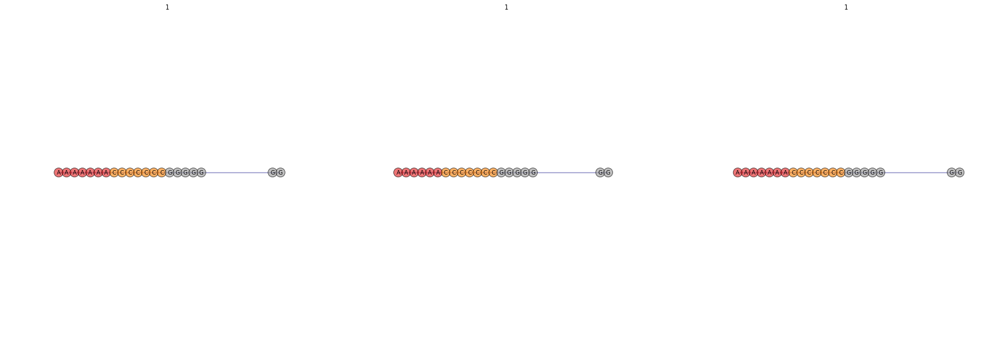

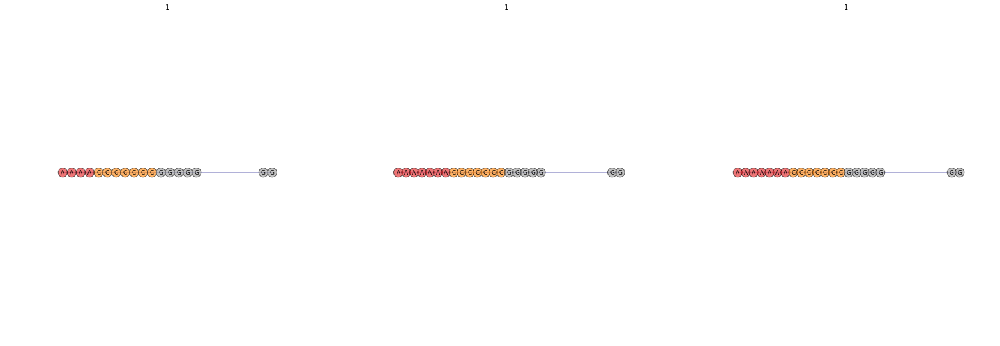

Class 1 [# 20]


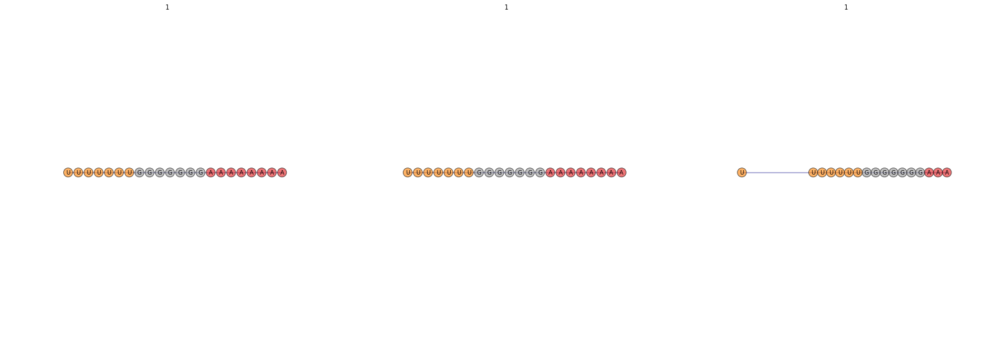

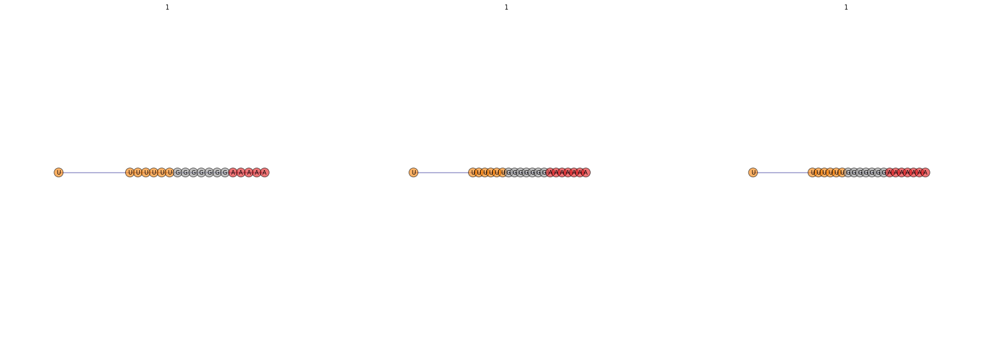

Class 2 [# 5]


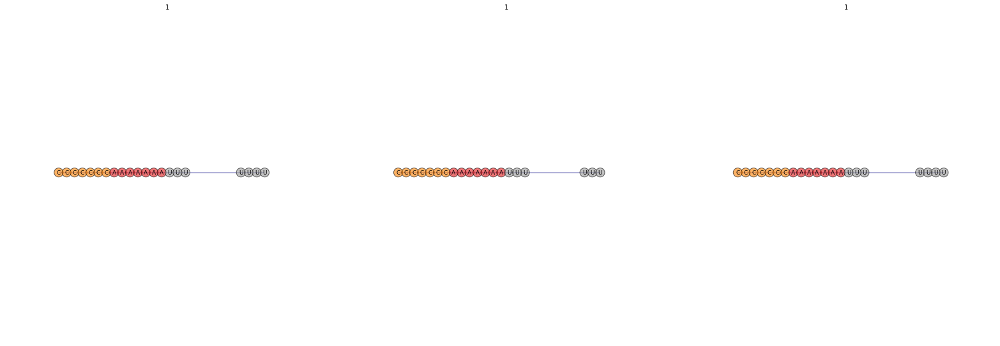

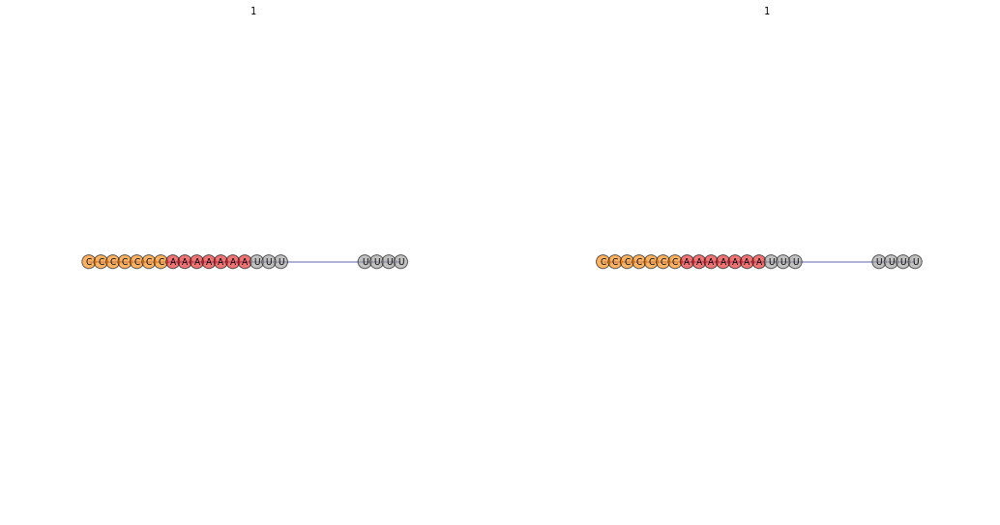

Class 3 [# 5]


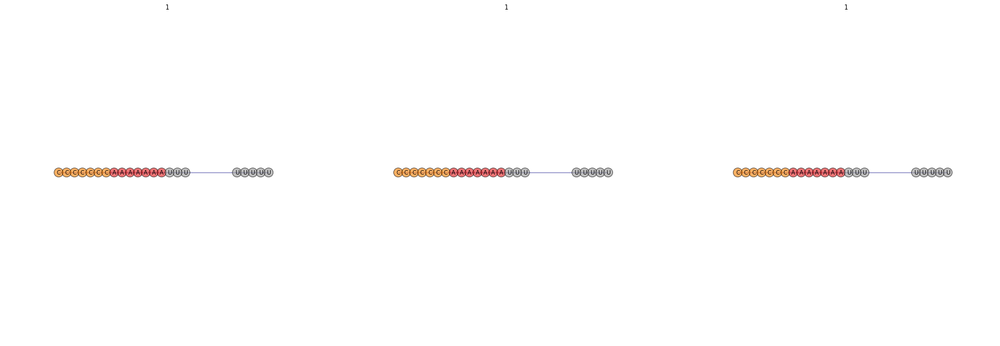

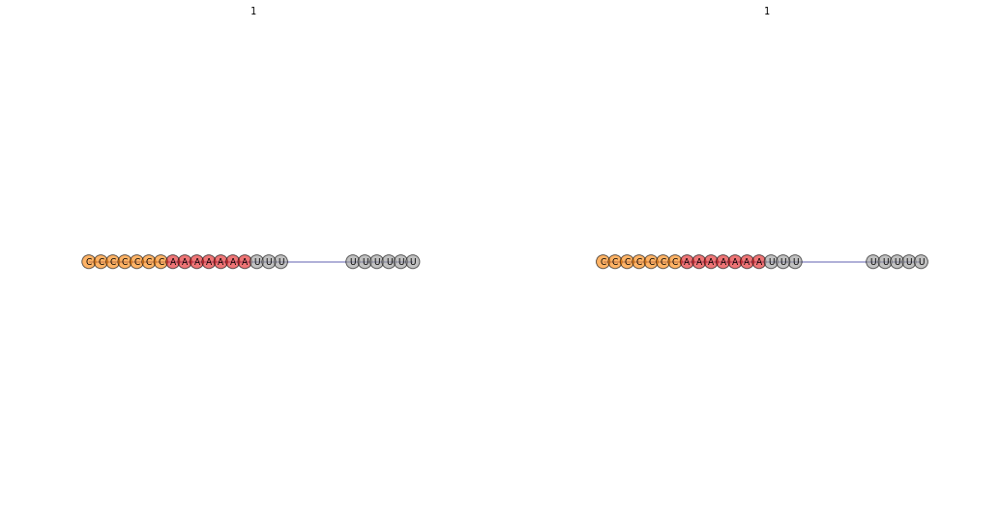

Class -1 [# 1148]


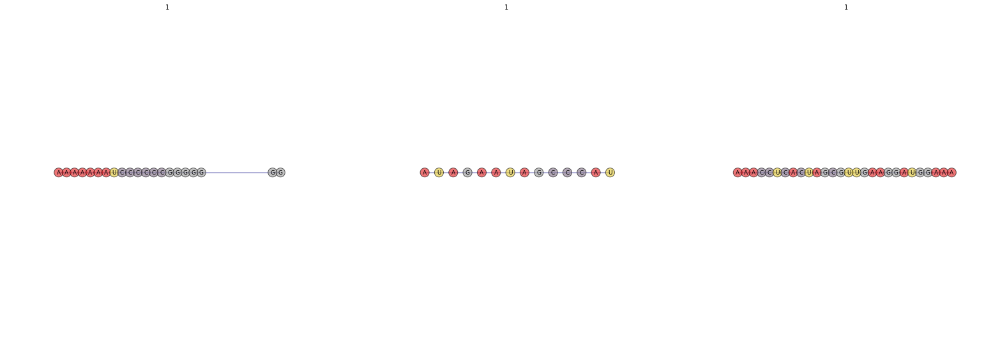

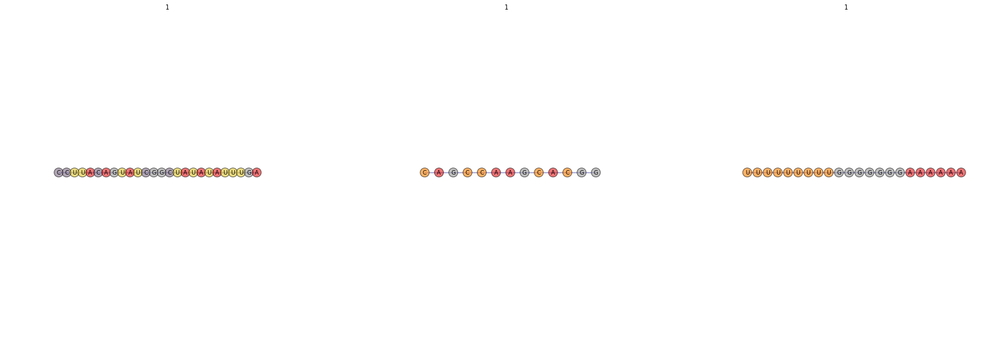

In [245]:
#plot
from itertools import islice
from eden.util.display import draw_graph_set
opts.update({'vertex_color':'_label_', 'colormap':'Set1', 'size':9})
print len(partition_list), 'classes'
for i in partition_list:
    print 'Class %d [# %d]'%(i,len(partition_list[i]))
    draw_graph_set(islice(partition_list[i],6), **opts)

In [246]:
from GArDen.transform.node import AddGraphAttributeValue
class_graphs_list = []
for target in partition_list:
    targeted_class_graphs = garden.transform(partition_list[target], program=AddGraphAttributeValue(attribute='target', value=target))
    class_graphs_list.append(targeted_class_graphs)
    
from GArDen.compose import Flatten
class_graphs = garden.compose(class_graphs_list, program=Flatten())

In [247]:
class_graphs=list(class_graphs)

In [248]:
%%time
from sklearn.linear_model import SGDClassifier
predictor2 = SGDClassifier()

from GArDen.model import ClassifierWrapper
wrapped_predictor2 = ClassifierWrapper(program=predictor2)

parameters_priors = dict(average=True, loss='hinge', penalty='l2', alpha=0.0001, l1_ratio=0.15, fit_intercept=True, n_iter=5, shuffle=True, verbose=0, epsilon=0.1, n_jobs=-1, random_state=None, learning_rate='optimal', eta0=0.0, power_t=0.5, class_weight='balanced', warm_start=False)
parameters_priors.update(dict(vectorizer__r=3,vectorizer__d=5, vectorize__n_jobs=-1, vectorize__fit_flag=False, vectorize__n_blocks=5, vectorize__block_size=None))
fit_wrapped_predictor2 = garden.model(class_graphs, program=wrapped_predictor2, parameters_priors=parameters_priors)

CPU times: user 13 s, sys: 2.55 s, total: 15.5 s
Wall time: 21.2 s


In [249]:
from GArDen.transform.importance_annotation import AnnotateImportance
annotated_train_graphs = garden.transform(train_graphs, program=AnnotateImportance(program=fit_wrapped_predictor2.program))

In [250]:
from GArDen.transform.contraction import Contract, contraction_modifier
label_modifier = contraction_modifier(attribute_in='class', attribute_out='label', reduction='set_categorical')
modifiers = [label_modifier]
priors = dict(nesting=True,  modifiers=[modifiers], weight_scaling_factor=1)
contracted_train_graphs = garden.transform(annotated_train_graphs, program=Contract(contraction_attribute='class'), parameters_priors=priors)

In [251]:
%%time
from sklearn.linear_model import SGDClassifier
predictor3 = SGDClassifier()

from GArDen.model import ClassifierWrapper
wrapped_predictor3 = ClassifierWrapper(program=predictor3)

parameters_priors = dict(average=True, loss='hinge', penalty='l2', alpha=0.0001, l1_ratio=0.15, fit_intercept=True, n_iter=5, shuffle=True, verbose=0, epsilon=0.1, n_jobs=-1, random_state=None, learning_rate='optimal', eta0=0.0, power_t=0.5, class_weight='balanced', warm_start=False)
parameters_priors.update(dict(vectorizer__r=3,vectorizer__d=5, vectorize__n_jobs=-1, vectorize__fit_flag=False, vectorize__n_blocks=5, vectorize__block_size=None))
fit_wrapped_predictor3 = garden.model(contracted_train_graphs, program=wrapped_predictor3, parameters_priors=parameters_priors)

CPU times: user 57.2 s, sys: 11.1 s, total: 1min 8s
Wall time: 1min 13s


In [252]:
from GArDen.transform.importance_annotation import AnnotateImportance
annotated_test_graphs = garden.transform(test_graphs, program=AnnotateImportance(program=fit_wrapped_predictor2.program))

In [253]:
from GArDen.transform.contraction import Contract, contraction_modifier
label_modifier = contraction_modifier(attribute_in='class', attribute_out='label', reduction='set_categorical')
modifiers = [label_modifier]
priors = dict(nesting=True,  modifiers=[modifiers], weight_scaling_factor=1)
contracted_test_graphs = garden.transform(annotated_test_graphs, program=Contract(contraction_attribute='class'), parameters_priors=priors)

In [254]:
%%time
contracted_test_graphs=list(contracted_test_graphs)

CPU times: user 39.8 s, sys: 5.83 s, total: 45.6 s
Wall time: 44.5 s


In [255]:
%%time
evaluate_predictability(contracted_test_graphs,fit_wrapped_predictor3)

Confusion matrix:
[[199   1]
 [  7  93]]
             precision    recall  f1-score   support

         -1       0.97      0.99      0.98       200
          1       0.99      0.93      0.96       100

avg / total       0.97      0.97      0.97       300

ROC: 0.997
CPU times: user 18.1 s, sys: 3.96 s, total: 22.1 s
Wall time: 28.2 s


---

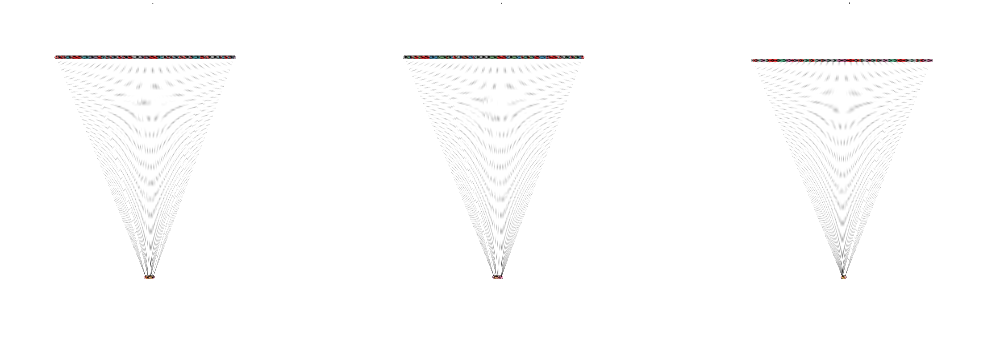

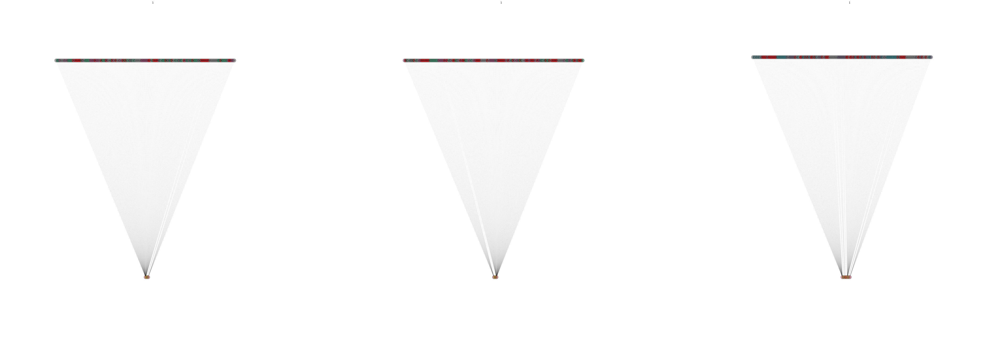

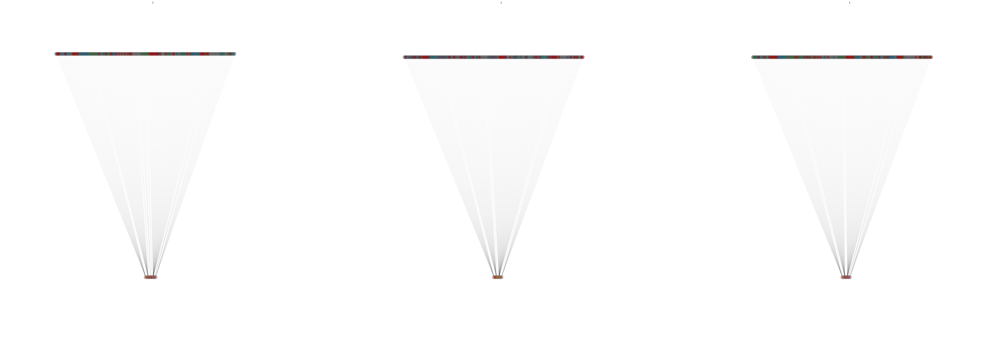

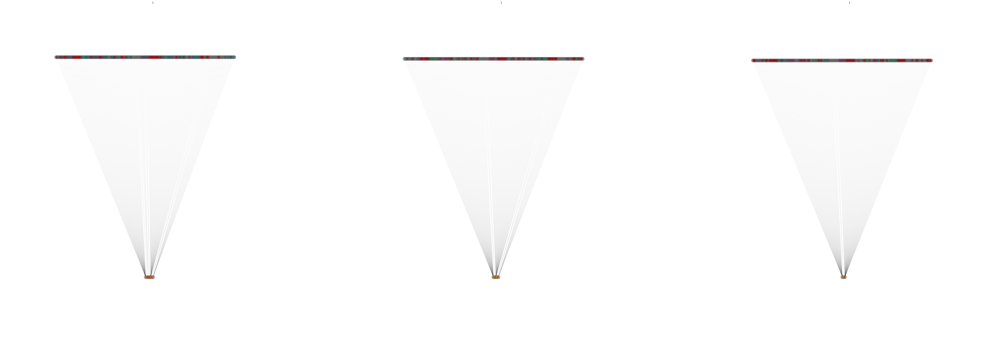

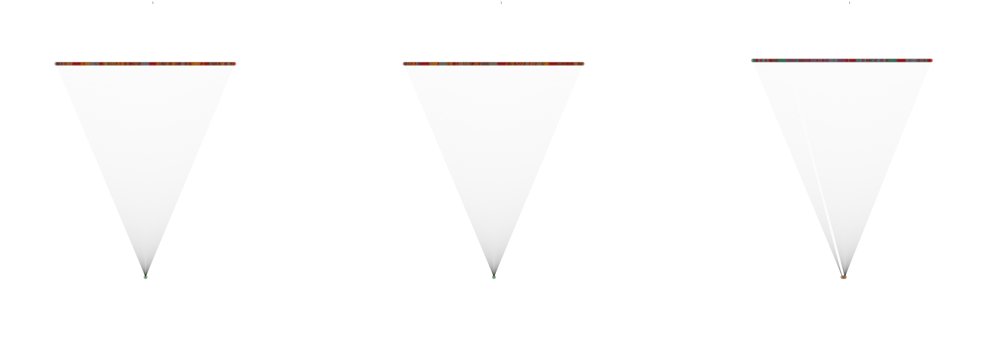

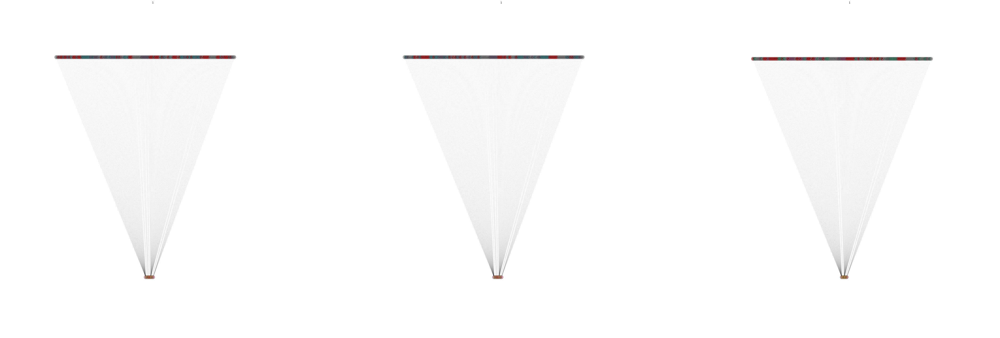

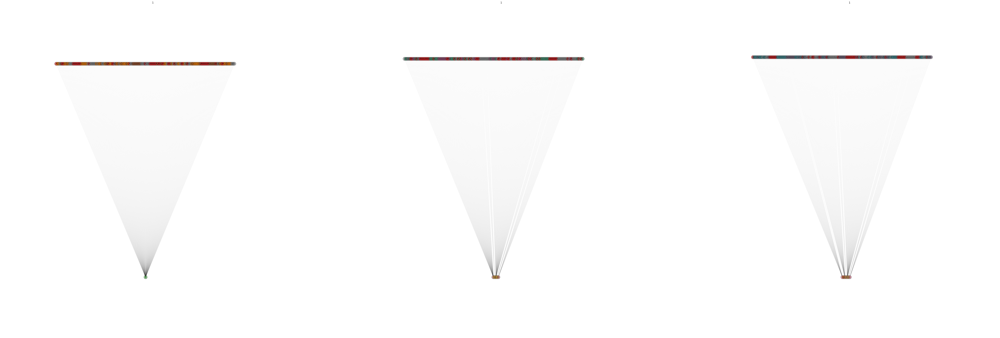

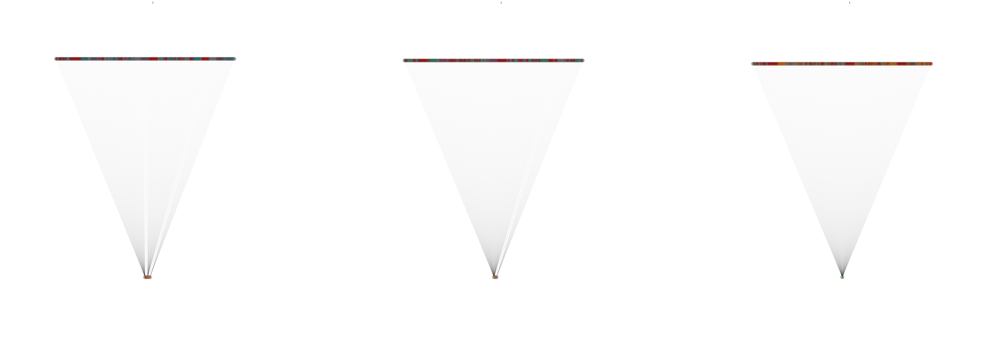

In [256]:
#plot
from itertools import islice
from eden.util.display import draw_graph_set
opts.update({'vertex_color':'_label_', 'colormap':'Set1', 'size':25,'title_key':'target'})
draw_graph_set(islice(contracted_test_graphs,24), **opts)

---